In [4]:
# Converting arc-second to pixel
from astropy.io import fits
import pandas as pd
import numpy as np

reference_data_file="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/Data/solo_L2_eui-hrieuv174-image_2022-03-17T03:18:00.235.fits"

data1=fits.open(reference_data_file)
n=0

cdelt1=data1[n].header['CDELT1']
cdelt2=data1[n].header['CDELT2']
crpix1=data1[n].header['CRPIX1']
crpix2=data1[n].header['CRPIX2']
crval1=data1[n].header['CRVAL1']
crval2=data1[n].header['CRVAL2']

def arcsec_to_pixel(x_data,y_data):
    x=int(crpix1+(x_data-crval1)/cdelt1)
    y=int(crpix2+(y_data-crval2)/cdelt2)
    return(x,y)

region_arcsec_file_path="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/regions_coords_arcsec.csv"
df=pd.read_csv(region_arcsec_file_path)
data=df.to_numpy()
for i in range(np.shape(data)[0]):
    print(arcsec_to_pixel(data[i,0],data[i,1]))

(1639, 639)
(2041, 1038)
(191, 229)
(1087, 1124)


In [5]:
# Plotting the location of the reference pixel

from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np
import glob

data_path="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/Data"

x_pix, y_pix, x_arcsec, y_arcsec =[], [], [], []

files=glob.glob(data_path+"/*.fits")
n=0

for file in files:
    data1=fits.open(file)
    crpix1=data1[n].header['CRPIX1']
    crpix2=data1[n].header['CRPIX2']
    crval1=data1[n].header['CRVAL1']
    crval2=data1[n].header['CRVAL2']
    x_pix.append(crpix1)
    y_pix.append(crpix2)
    x_arcsec.append(crval1)
    y_arcsec.append(crval2)

Text(0, 0.5, 'y [px]')

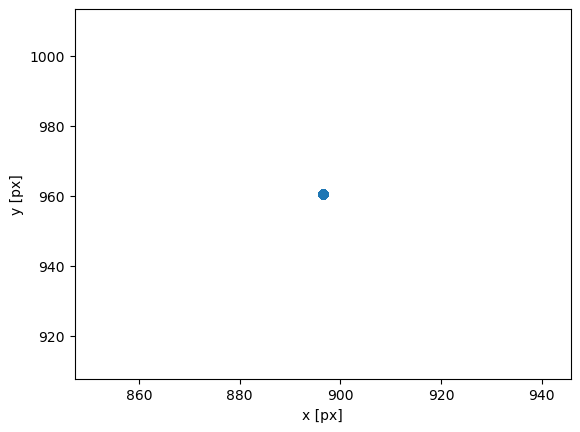

In [9]:
plt.scatter(x_pix,y_pix)
plt.xlabel("x [px]")
plt.ylabel("y [px]")

Text(0, 0.5, 'y [arcsec]')

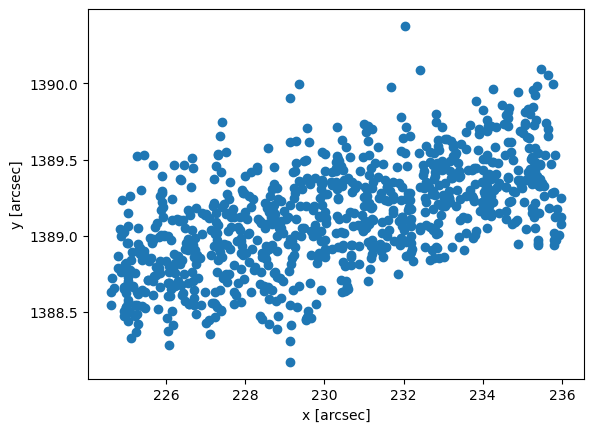

In [8]:
plt.scatter(x_arcsec,y_arcsec)
plt.xlabel("x [arcsec]")
plt.ylabel("y [arcsec]")

/tmp/ipykernel_142303/1414010692.py:5: DeprecationWarning: Please use `readsav` from the `scipy.io` namespace, the `scipy.io.idl` namespace is deprecated.
  from scipy.io.idl import readsav


--------------------------------------------------
Date: Fri May 26 19:29:00 2023
User: arpit
Host: ARIES
--------------------------------------------------
Format: 12
Architecture: x86_64
Operating System: linux
IDL Version: 8.7.0
--------------------------------------------------
Successfully read 5 records of which:
 - 1 are of type TIMESTAMP
 - 1 are of type VERSION
 - 2 are of type VARIABLE
--------------------------------------------------
Available variables:
 - data [<class 'numpy.ndarray'>]
 - hdr [<class 'numpy.recarray'>]
--------------------------------------------------


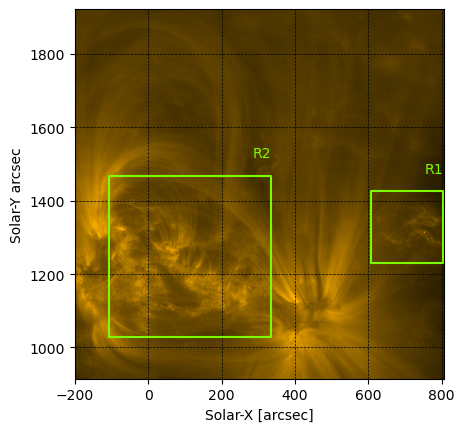

In [1]:
# Plotting the box around the region R1 and R2 in the bigger frame
import matplotlib
import sunpy.visualization.colormaps as cm
import pandas as pd
from scipy.io.idl import readsav
from types import SimpleNamespace
#from astropy.io import fits
import matplotlib.pyplot as plt
import numpy as np

cmap=matplotlib.colormaps['sdoaia171']

data_path="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/Data_full/Data/solo_L2_eui-hrieuv174-image_2022-03-17T03:18:00.235.sav"
region_info_path="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/regions_coords_pixel.csv"

df1=readsav(data_path, python_dict=True, verbose=True)
var =  SimpleNamespace(**df1)
data=var.data
header=var.hdr
df=pd.read_csv(region_info_path,sep=',',header=0,names=["region name","xi","yi","xf","yf"])
region_info=df.to_numpy()

n1=header['NAXIS1'][0]
n2=header['NAXIS2'][0]
cdelt1=header['CDELT1'][0]
cdelt2=header['CDELT2'][0]
crpix1=header['CRPIX1'][0]
crpix2=header['CRPIX2'][0]
crval1=header['CRVAL1'][0]
crval2=header['CRVAL2'][0]

left=crval1-cdelt1*crpix1
right=crval1+cdelt1*(n2-crpix1)

bottom=crval2-cdelt2*crpix2
top=crval2+cdelt2*(n2-crpix2)

def pixel_to_arcsec(x_data,y_data):
    x=crval1+(x_data-crpix1)*cdelt1
    y=crval2+(y_data-crpix2)*cdelt2
    return([x,y])

r1_y1, r1_x1, r1_y2, r1_x2=region_info[0,1],region_info[0,2],region_info[0,3],region_info[0,4]
r2_x1, r2_y1, r2_x2, r2_y2=region_info[1,1],region_info[1,2],region_info[1,3],region_info[1,4]

r1_x1, r1_y1=pixel_to_arcsec(r1_x1,r1_y1)
r1_x2, r1_y2=pixel_to_arcsec(r1_x2,r1_y2)
r2_x1, r2_y1=pixel_to_arcsec(r2_x1,r2_y1)
r2_x2, r2_y2=pixel_to_arcsec(r2_x2,r2_y2)

r1_x=[r1_x1,r1_x1,r1_x2,r1_x2,r1_x1]
r1_y=[r1_y1,r1_y2,r1_y2,r1_y1,r1_y1]
r2_x=[r2_x1,r2_x1,r2_x2,r2_x2,r2_x1]
r2_y=[r2_y1,r2_y2,r2_y2,r2_y1,r2_y1]

data=data**0.35
# print(data**0.1)
# print(fits.open(data_path)[0].header)

scale=135

#plt.xticks(np.arange(np.shape(data)[1])[::500],np.arange(np.shape(data)[1])[::500]*scale*10**(-3))
#plt.yticks(np.arange(np.shape(data)[1])[::500],np.arange(np.shape(data)[1])[::500]*scale*10**(-3))
#plt.imshow(data[639:1038,1639:2041],cmap=cmap,origin='lower')
#plt.imshow(data[191:1087,229:1124],cmap=cmap,origin='lower')
plt.imshow(data,cmap=cmap,extent=[left,right,bottom,top],origin='lower')
#plt.imshow(data,cmap=cmap,origin='lower')
plt.plot(r1_x,r1_y,c='lawngreen')
plt.plot(r2_x,r2_y,c='lawngreen')
plt.text(r1_x2-50,r1_y2+50,"R1",c='lawngreen')
plt.text(r2_x2-50,r2_y2+50,"R2",c='lawngreen')
plt.xlabel("Solar-X [arcsec]")
plt.ylabel("Solar-Y arcsec")
plt.grid(True,color='k',linestyle='--',linewidth=0.5)
plt.savefig("full_with_region.png",dpi=1200)

NameError: name 'left' is not defined

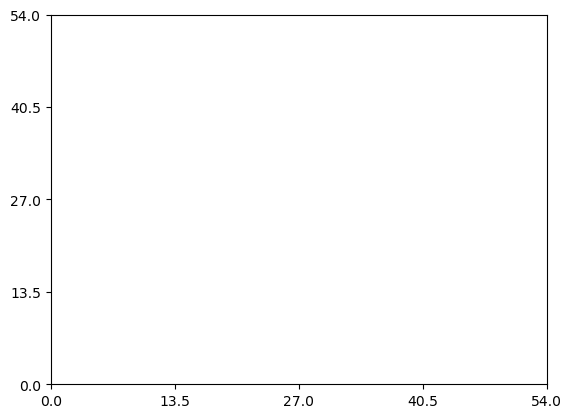

In [5]:
# Plotting the selected region with slits
# R1
from astropy.io import fits
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import sunpy.visualization.colormaps as cm
import numpy as np

cmap=matplotlib.colormaps['sdoaia171']

slit_location_file="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R1/Slits/slits_location_pixel.csv"
data_file="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R1/Data/0000.npy"

df=pd.read_csv(slit_location_file,sep=',',header=0,names=["slit name","xi","yi","xf","yf","width"])
data_slits=df.to_numpy()

df1=np.load(data_file,allow_pickle='TRUE').item()
data=df1['data']
header=df1['hdr']

scale=135

plt.xticks(np.arange(np.shape(data)[1])[::100],np.arange(np.shape(data)[1])[::100]*scale*10**(-3))
plt.yticks(np.arange(np.shape(data)[1])[::100],np.arange(np.shape(data)[1])[::100]*scale*10**(-3))
plt.imshow(data**0.35,cmap=cmap,origin='lower',extent=[left,right,bottom,top])
plt.xlabel("Distance [Mm]")
plt.ylabel("Distance [Mm]")
plt.title("R1")

for i in range(np.shape(data_slits)[0]):
    plt.plot([data_slits[i,1],data_slits[i,3]],[data_slits[i,2],data_slits[i,4]],label=data_slits[i,0],c='cyan',linewidth=0.8)
    plt.text((data_slits[i,1]+3),(data_slits[i,2]+13),data_slits[i,0],c='magenta',fontsize=8)

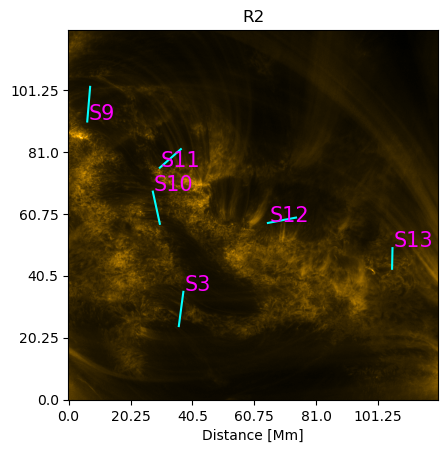

In [19]:
# Plotting the selected region with slits
# R2
from astropy.io import fits
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import sunpy.visualization.colormaps as cm
import numpy as np

cmap=matplotlib.colormaps['sdoaia171']

slit_location_file="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R2/Slits/slits_location_pixel.csv"
data_file="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R2/Data/0000.fits"

df=pd.read_csv(slit_location_file,sep=',',header=0,names=["slit name","xi","yi","xf","yf","width"])
data_slits=df.to_numpy()

data=fits.open(data_file)[0].data**0.35
scale=135

plt.xlabel("Distance [Mm]")
# plt.ylabel("Distance [Mm]")
plt.xticks(np.arange(np.shape(data)[1])[::150],np.arange(np.shape(data)[1])[::150]*scale*10**(-3))
plt.yticks(np.arange(np.shape(data)[1])[::150],np.arange(np.shape(data)[1])[::150]*scale*10**(-3))
plt.imshow(data**0.35,cmap=cmap,origin='lower')
plt.title("R2")

for i in range(np.shape(data_slits)[0]):
    plt.plot([data_slits[i,1],data_slits[i,3]],[data_slits[i,2],data_slits[i,4]],label=data_slits[i,0],c='cyan')
    plt.text(data_slits[i,1]+3,data_slits[i,2]+3,data_slits[i,0],c='magenta',fontsize=15)

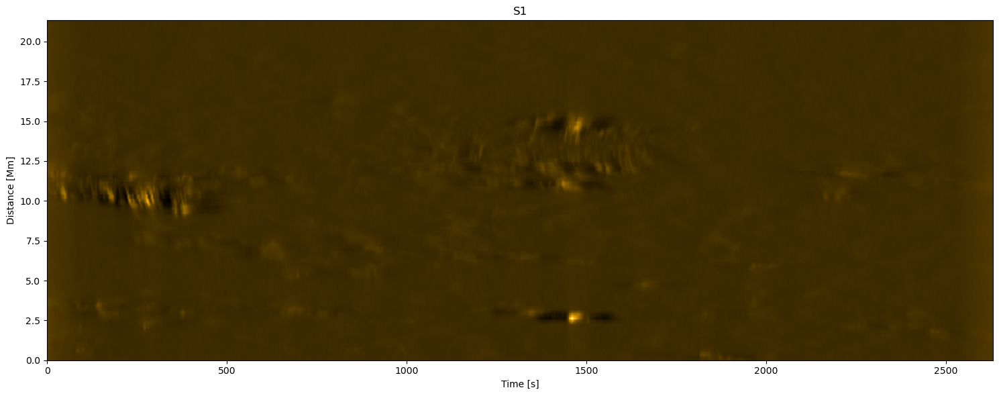

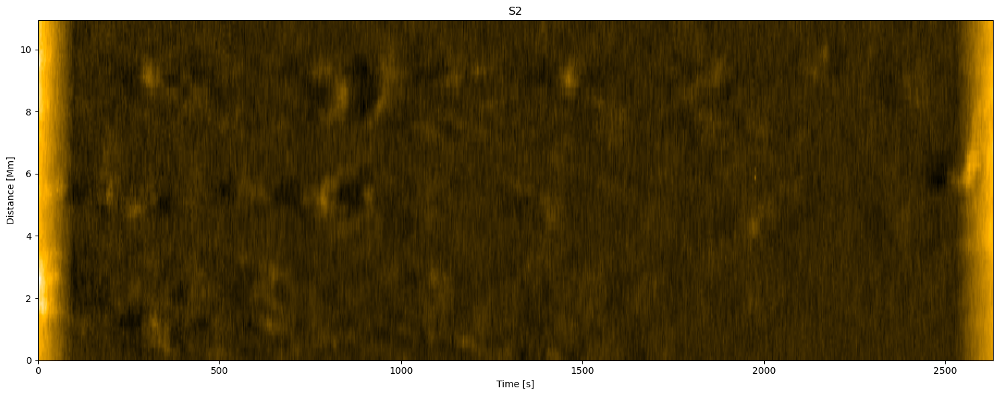

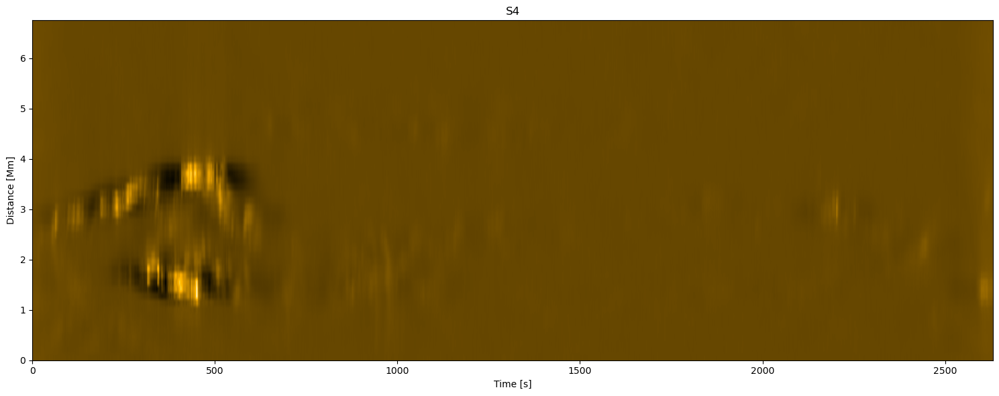

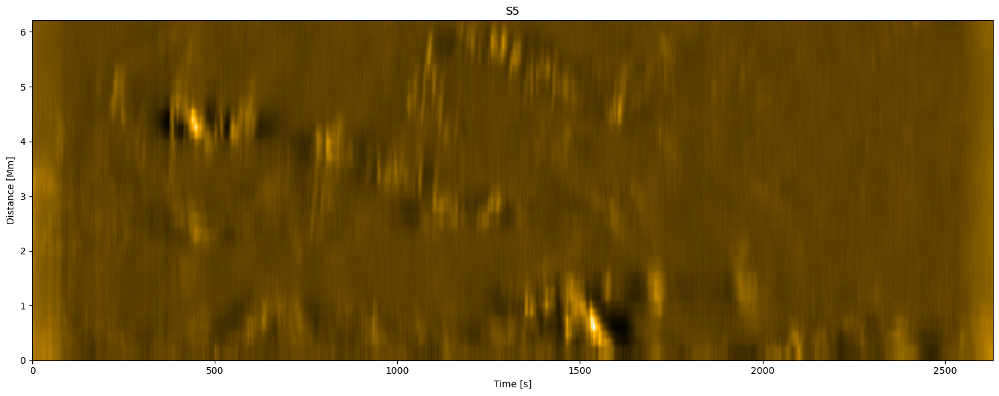

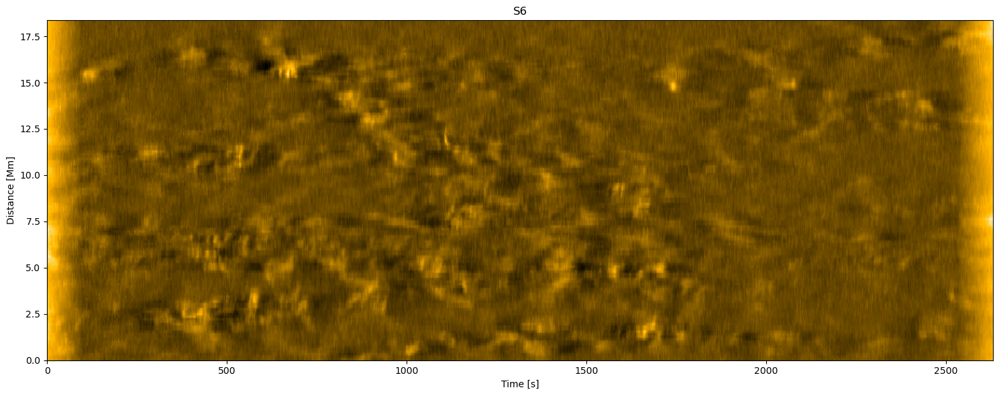

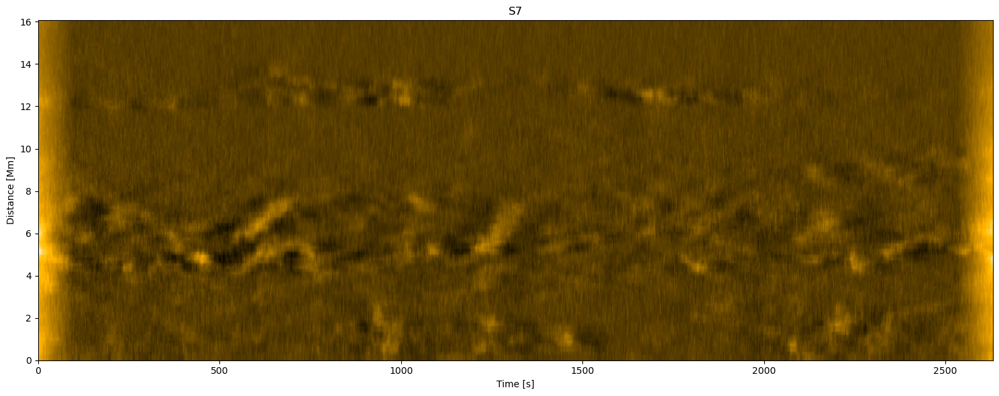

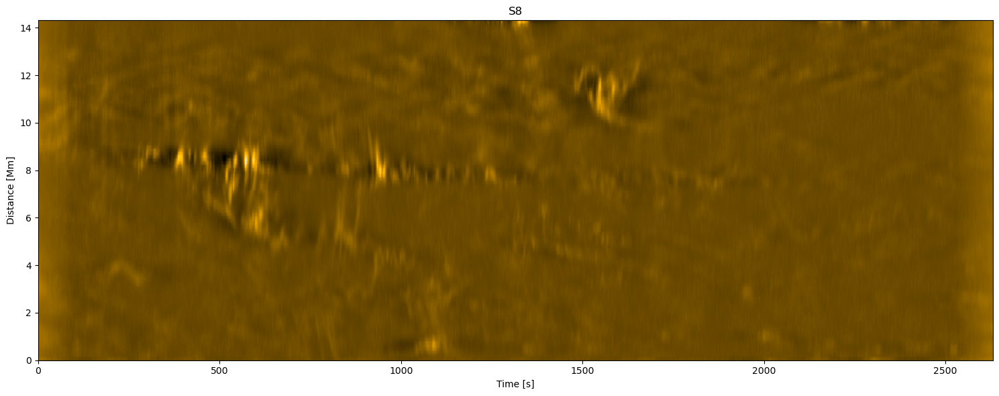

In [14]:
# plotting all the XT-maps of R1 and R2
# R1
import pandas as pd
import matplotlib
import sunpy.visualization.colormaps as cm
import matplotlib.pyplot as plt
import glob
import numpy as np

cmap=matplotlib.colormaps['sdoaia171']

path_to_slits="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R1/Slits"+"/"

slits=sorted(glob.glob(path_to_slits+"S*"))
scale=0.135
cadence=3

for slit in slits:
    xt_map=pd.read_csv(slit+"/"+"xt_map_smooth_201.csv")
    xt_map_data=xt_map.to_numpy().T
    slit_info=pd.read_csv(slit+"/"+"info.csv",sep=',',header=0,names=["slit name","xi","yi","xf","yf","width","folder"])
    slit_info_data=slit_info.to_numpy()
    fig=plt.figure(figsize=(15,6))
    # plt.xticks(np.arange(np.shape(xt_map_data)[1])[::100],np.arange(np.shape(xt_map_data)[1])[::100]*cadence)
    # plt.yticks(np.arange(np.shape(xt_map_data)[0])[::15],np.arange(np.shape(xt_map_data)[0])[::15]*scale*10**(-3))
    left=0
    bottom=0
    right=np.shape(xt_map_data)[1]*cadence
    top=np.shape(xt_map_data)[0]*scale
    plt.imshow(xt_map_data,origin='lower',extent=[left,right,bottom,top],cmap=cmap,aspect='auto')
    plt.xlabel("Time [s]")
    plt.ylabel("Distance [Mm]")
    plt.title(f"{slit_info_data[0,0]}")
    plt.tight_layout()
    plt.savefig(slit+"/"+f"{slit_info_data[0][0]}.png",dpi=100)



In [4]:
np.shape(xt_map_data)

(106, 877)

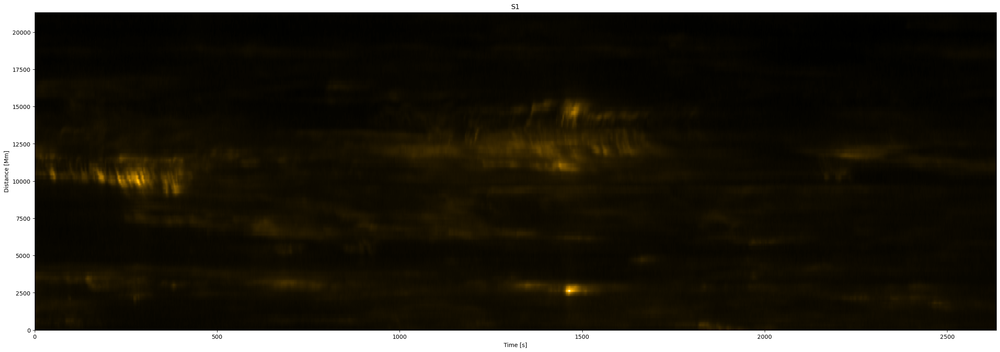

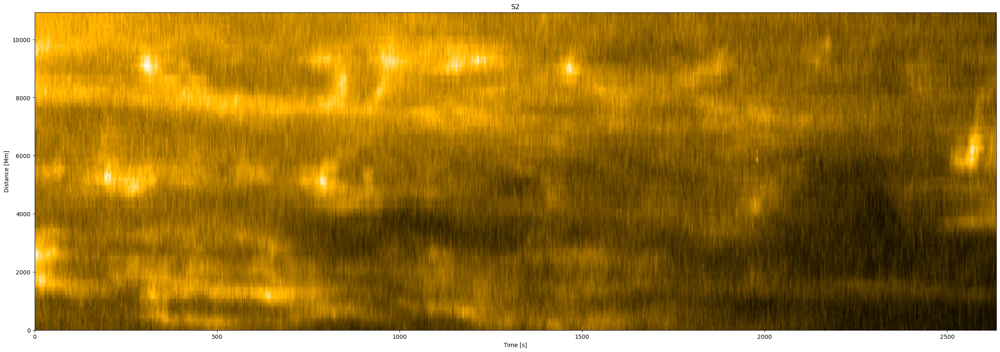

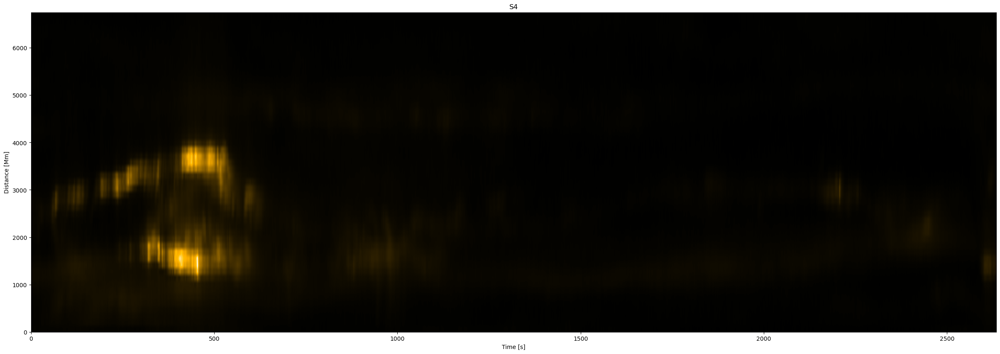

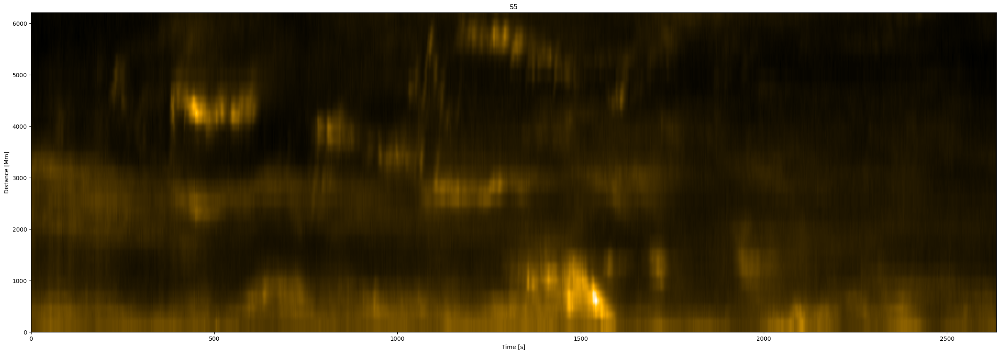

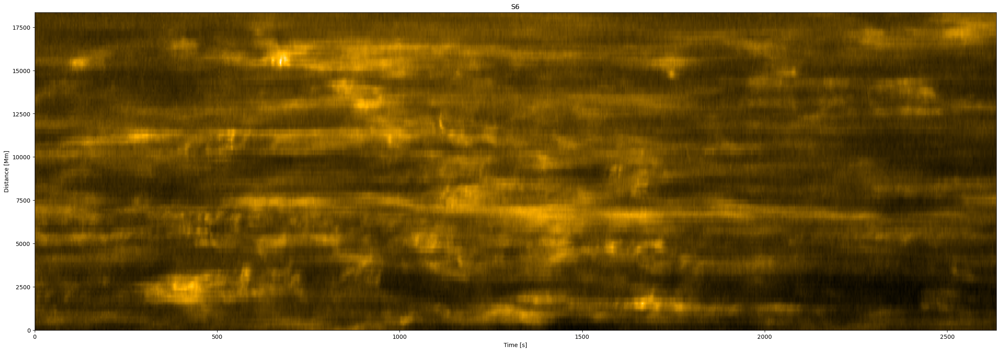

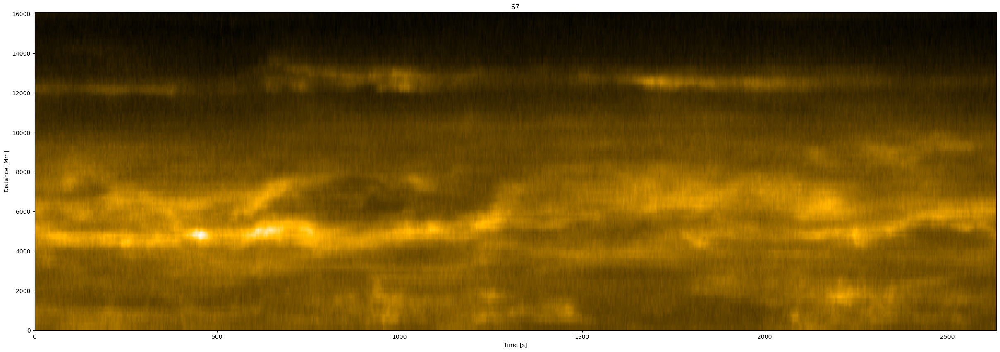

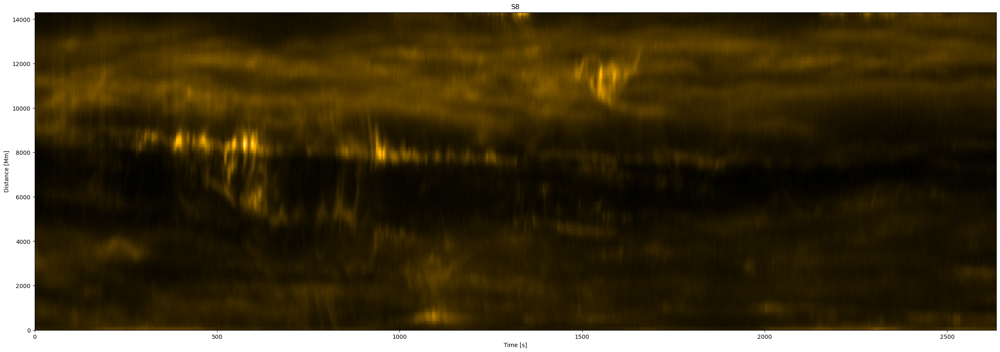

In [13]:
# plotting all the XT-maps of R1 and R2
# R1
import pandas as pd
import matplotlib
import sunpy.visualization.colormaps as cm
import matplotlib.pyplot as plt
import glob
import numpy as np

cmap=matplotlib.colormaps['sdoaia171']

path_to_slits="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R1/Slits"+"/"

slits=sorted(glob.glob(path_to_slits+"S*"))
scale=135
cadence=3

for slit in slits:
    xt_map=pd.read_csv(slit+"/"+"xt_map.csv")
    xt_map_data=xt_map.to_numpy().T
    slit_info=pd.read_csv(slit+"/"+"info.csv",sep=',',header=0,names=["slit name","xi","yi","xf","yf","width","folder"])
    slit_info_data=slit_info.to_numpy()
    fig=plt.figure(figsize=(30,10))
    # plt.xticks(np.arange(np.shape(xt_map_data.T)[1])[::100],np.arange(np.shape(xt_map_data.T)[1])[::100]*cadence)
    # plt.yticks(np.arange(np.shape(xt_map_data.T)[0])[::15],np.arange(np.shape(xt_map_data.T)[0])[::15]*scale*10**(-3))
    # plt.imshow(xt_map_data.T,origin='lower',cmap=cmap)
    left=0
    bottom=0
    right=np.shape(xt_map_data)[1]*cadence
    top=np.shape(xt_map_data)[0]*scale
    plt.imshow(xt_map_data,origin='lower',extent=[left,right,bottom,top],cmap=cmap,aspect='auto')
    #plt.imshow(xt_map_data,origin='lower',cmap=cmap)
    plt.xlabel("Time [s]")
    plt.ylabel("Distance [Mm]")
    plt.title(f"{slit_info_data[0,0]}")

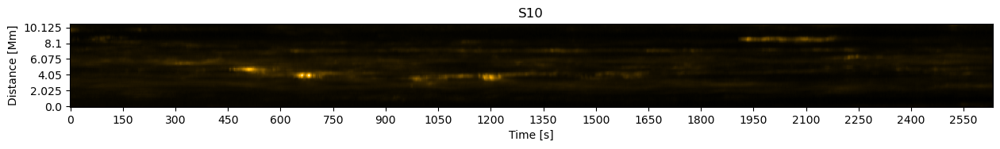

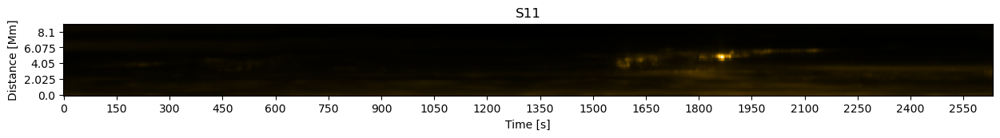

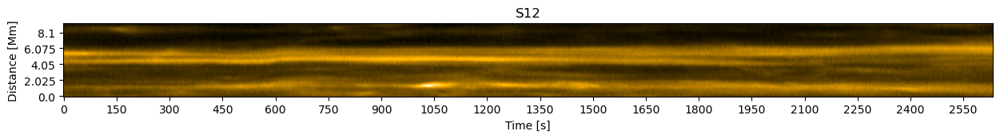

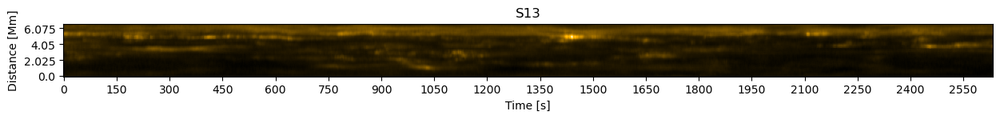

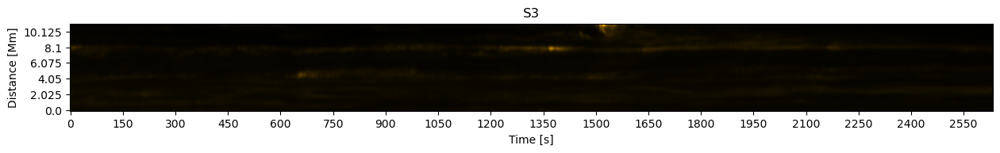

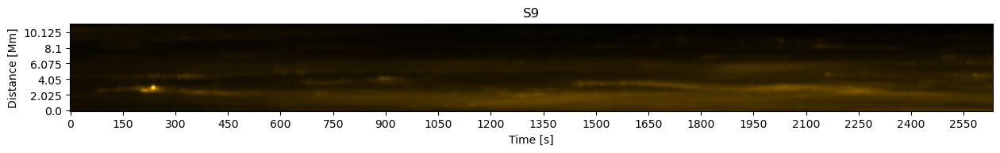

In [40]:
# R2
import pandas as pd
import matplotlib
import sunpy.visualization.colormaps as cm
import matplotlib.pyplot as plt
import glob

cmap=matplotlib.colormaps['sdoaia171']

path_to_slits="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R2/Slits"+"/"

slits=sorted(glob.glob(path_to_slits+"S*"))
scale=135
cadence=3

for slit in slits:
    xt_map=pd.read_csv(slit+"/"+"xt_map.csv")
    xt_map_data=xt_map.to_numpy().T
    slit_info=pd.read_csv(slit+"/"+"info.csv",sep=',',header=0,names=["slit name","xi","yi","xf","yf","width","folder"])
    slit_info_data=slit_info.to_numpy()
    fig=plt.figure(figsize=(15,18))
    plt.xticks(np.arange(np.shape(xt_map_data)[1])[::50],np.arange(np.shape(xt_map_data)[1])[::50]*cadence)
    plt.yticks(np.arange(np.shape(xt_map_data)[0])[::15],np.arange(np.shape(xt_map_data)[0])[::15]*scale*10**(-3))
    plt.imshow(xt_map_data,origin='lower',cmap=cmap)
    plt.title(f"{slit_info_data[0,0]}")
    plt.xlabel("Time [s]")
    plt.ylabel("Distance [Mm]")

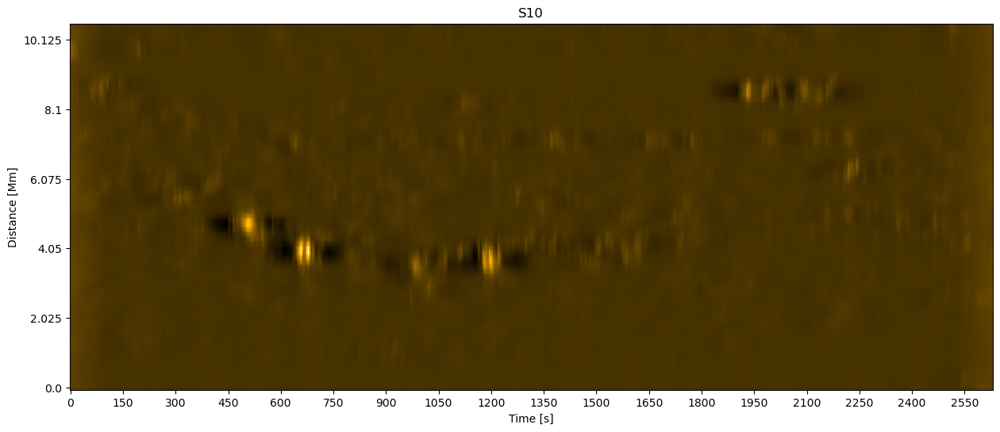

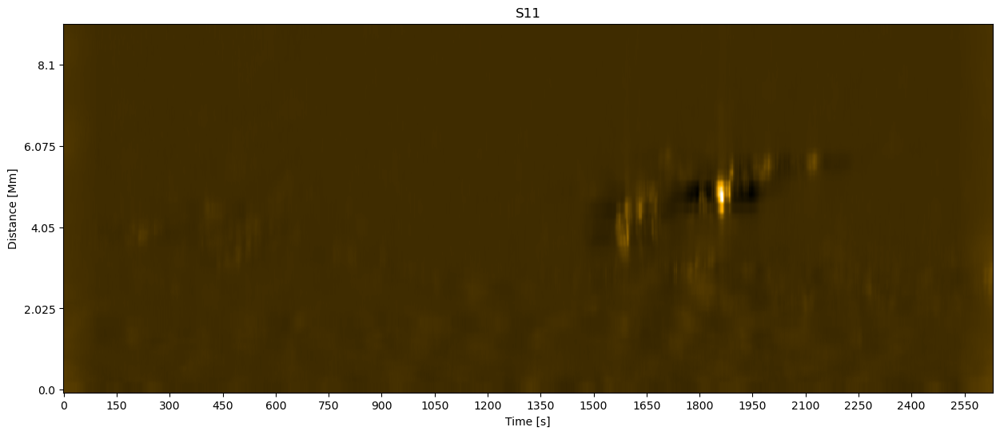

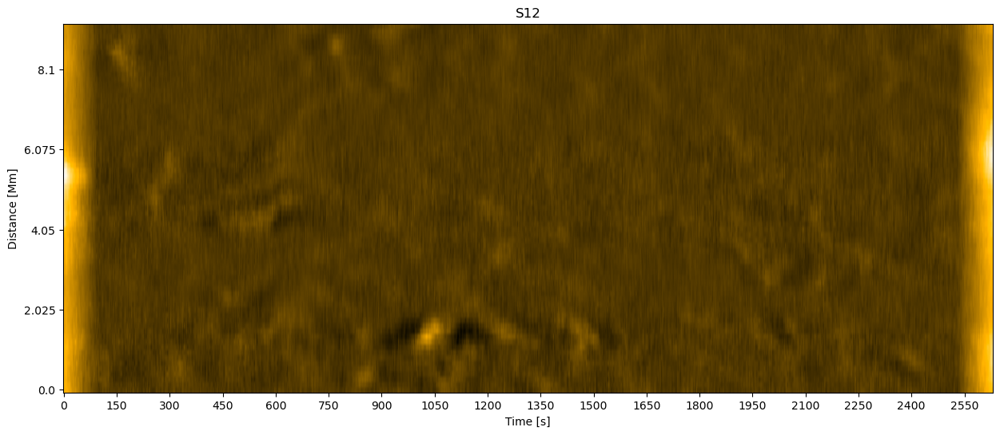

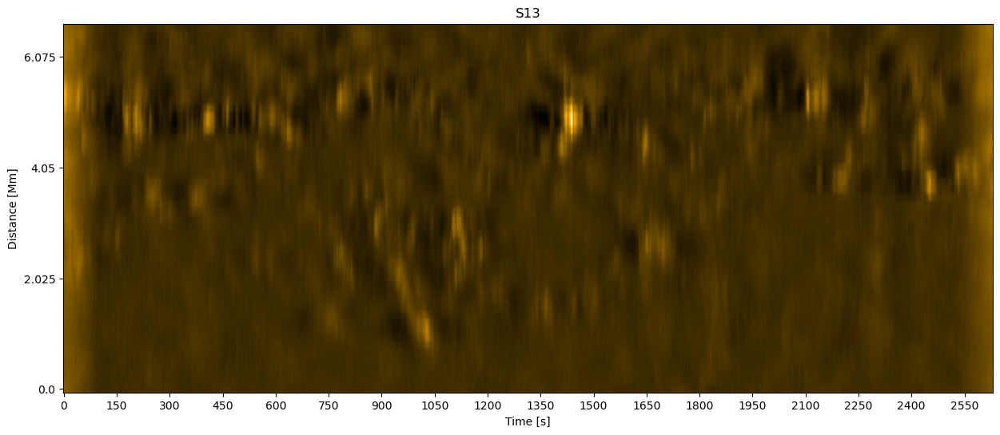

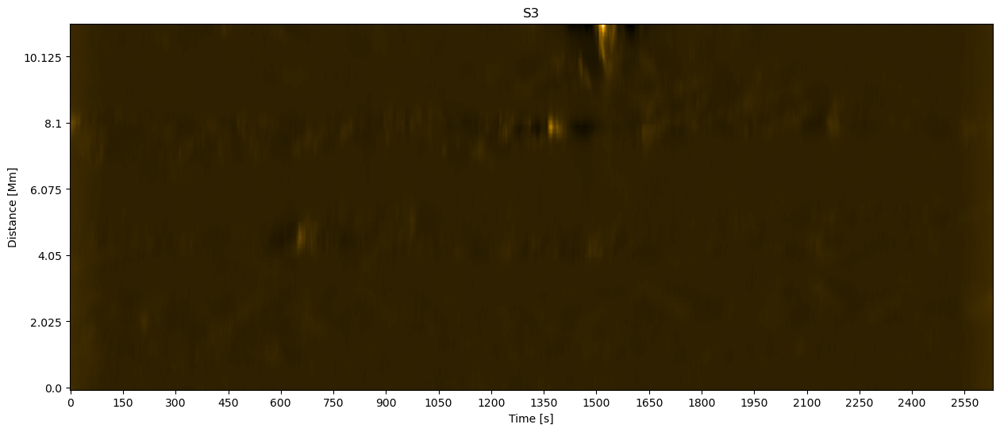

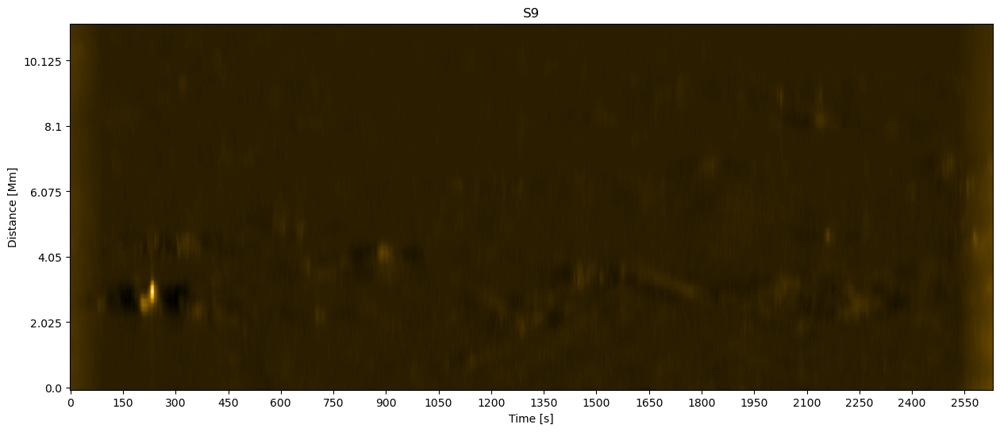

In [8]:
# R2
import pandas as pd
import matplotlib
import sunpy.visualization.colormaps as cm
import matplotlib.pyplot as plt
import glob
import numpy as np

cmap=matplotlib.colormaps['sdoaia171']

path_to_slits="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R2/Slits"+"/"

slits=sorted(glob.glob(path_to_slits+"S*"))
scale=135
cadence=3

for slit in slits:
    xt_map=pd.read_csv(slit+"/"+"xt_map_smooth_201.csv")
    xt_map_data=xt_map.to_numpy().T
    slit_info=pd.read_csv(slit+"/"+"info.csv",sep=',',header=0,names=["slit name","xi","yi","xf","yf","width","folder"])
    slit_info_data=slit_info.to_numpy()
    fig=plt.figure(figsize=(15,6))
    plt.xticks(np.arange(np.shape(xt_map_data)[1])[::50],np.arange(np.shape(xt_map_data)[1])[::50]*cadence)
    plt.yticks(np.arange(np.shape(xt_map_data)[0])[::15],np.arange(np.shape(xt_map_data)[0])[::15]*scale*10**(-3))
    plt.imshow(xt_map_data,origin='lower',cmap=cmap,aspect='auto')
    plt.title(f"{slit_info_data[0,0]}")
    plt.xlabel("Time [s]")
    plt.ylabel("Distance [Mm]")

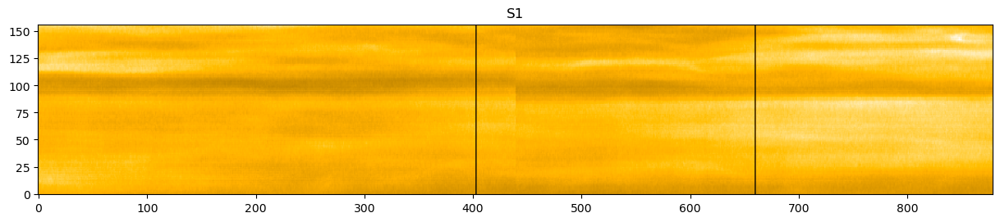

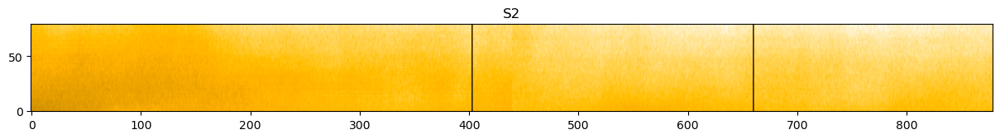

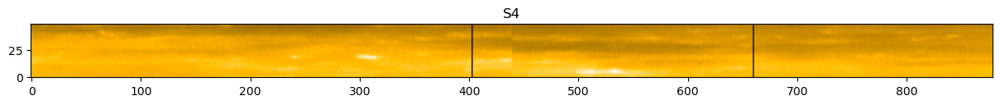

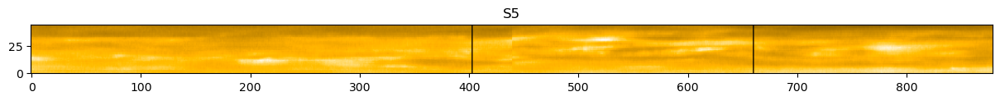

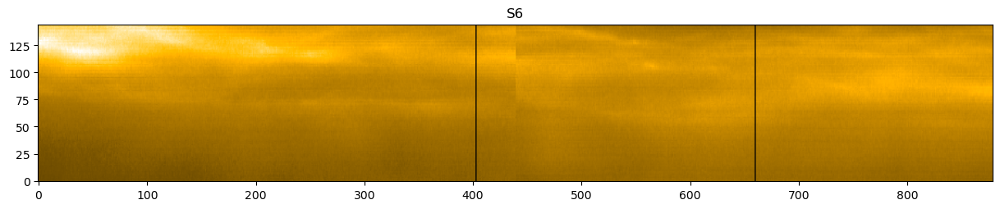

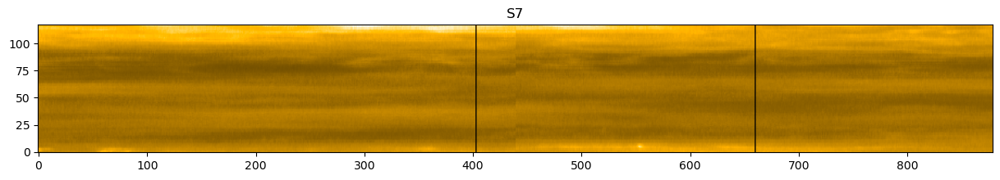

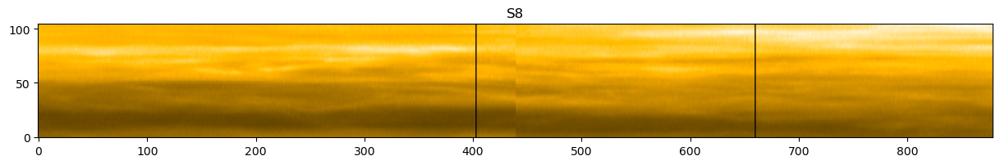

In [1]:
# Data_full
import pandas as pd
import matplotlib
import sunpy.visualization.colormaps as cm
import matplotlib.pyplot as plt
import glob

cmap=matplotlib.colormaps['sdoaia171']

path_to_slits="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/Data_full/Slits"+"/"

slits=sorted(glob.glob(path_to_slits+"S*"))

for slit in slits:
    xt_map=pd.read_csv(slit+"/"+"xt_map.csv")
    xt_map_data=xt_map.to_numpy()
    slit_info=pd.read_csv(slit+"/"+"info.csv",sep=',',header=0,names=["slit name","xi","yi","xf","yf","width","folder"])
    slit_info_data=slit_info.to_numpy()
    fig=plt.figure(figsize=(15,18))
    plt.imshow(xt_map_data,origin='lower',cmap=cmap)
    plt.title(f"{slit_info_data[0,0]}")
    plt.show()

In [26]:
#SAV to video

from astropy.io import fits
import matplotlib.pyplot as plt
import matplotlib
import glob
import sunpy.visualization.colormaps as cm
import numpy as np
import os
from scipy.io.idl import readsav
from types import SimpleNamespace

global folder_out
global i
global top
global bottom
global left
global right
global mini
global maxi
global dpi
global ax1_unit
global ax2_unit
global gam
global path_save
global img_save
global n
global cmap

cmap= matplotlib.colormaps['sdoaia171']

folder_in="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R1/Data"
vid_name="full"
dpi=300
gam=0.35
path_save="img"

os.system("mkdir {}/img".format(folder_in))
vid_name=folder_in+"/"+vid_name
img_save=folder_in+"/"+"img/"
folder_in=folder_in+"/"+"*.sav"


pth_first_file=sorted(glob.glob(folder_in))[0]

#data1=fits.open(pth_first_file)
df1=readsav(pth_first_file, python_dict=True, verbose=True)
var =  SimpleNamespace(**df1)
data1=var.data
header1=var.hdr
n=0

maxi=abs(0.8*header1['DATAMAX'])**gam
mini=abs(header1['DATAMIN'])**gam

#file=fits.open(pth_first_file)
# df1=readsav(, python_dict=True, verbose=True)
# var =  SimpleNamespace(**df1)
# data=var.data
# header=var.hdr
#dat=file[n].data

def bytescale(image):
    image=image-mini
    image=image/(maxi-mini)
    image=image*255
    image=np.rint(image)
    return(image)

def fits_to_img(path_load):
    df=readsav(path_load, python_dict=True, verbose=True)
    var =  SimpleNamespace(**df)
    dat=var.data
    header=var.hdr
    gamma_transformed_data=dat**gam
    dat=bytescale(gamma_transformed_data)

    plt.figure()
    plt.title(str(header['DATE_D$OBS'][0])[1::]+ " Frame {}".format(i))
    plt.xlabel("Solar-X [arcsec]")
    plt.ylabel("Solar-Y [arcsec]")
    plt.imshow(dat,origin='lower',extent=[left,right,bottom,top],cmap=cmap)
    plt.savefig(img_save+"{:03d}".format(i)+".png",dpi=dpi)
    plt.close()

i=0

for path_load in sorted(glob.glob(folder_in)):
    i+=1
    print("{}/{}".format(i,len(glob.glob(folder_in))))
    fits_to_img(path_load)

cmd='ffmpeg -framerate 60 -start_number 0 -i {}%3d.png -vcodec mpeg4 -vb 20M '.format(img_save)+'{}.mp4'.format(vid_name)
os.system(cmd)
os.system("rm -r {}".format(img_save))


/tmp/ipykernel_114381/3901753185.py:10: DeprecationWarning: Please use `readsav` from the `scipy.io` namespace, the `scipy.io.idl` namespace is deprecated.
  from scipy.io.idl import readsav
mkdir: cannot create directory ‘/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/Data_full/Data/img’: File exists


--------------------------------------------------
Date: Fri May 26 19:29:00 2023
User: arpit
Host: ARIES
--------------------------------------------------
Format: 12
Architecture: x86_64
Operating System: linux
IDL Version: 8.7.0
--------------------------------------------------
Successfully read 5 records of which:
 - 1 are of type TIMESTAMP
 - 2 are of type VARIABLE
 - 1 are of type VERSION
--------------------------------------------------
Available variables:
 - data [<class 'numpy.ndarray'>]
 - hdr [<class 'numpy.recarray'>]
--------------------------------------------------
1/879
--------------------------------------------------
Date: Fri May 26 19:29:00 2023
User: arpit
Host: ARIES
--------------------------------------------------
Format: 12
Architecture: x86_64
Operating System: linux
IDL Version: 8.7.0
--------------------------------------------------
Successfully read 5 records of which:
 - 1 are of type TIMESTAMP
 - 2 are of type VARIABLE
 - 1 are of type VERSION
-----

/tmp/ipykernel_114381/3901753185.py:75: RuntimeWarning: invalid value encountered in power
  gamma_transformed_data=dat**gam


3/879
--------------------------------------------------
Date: Fri May 26 19:29:00 2023
User: arpit
Host: ARIES
--------------------------------------------------
Format: 12
Architecture: x86_64
Operating System: linux
IDL Version: 8.7.0
--------------------------------------------------
Successfully read 5 records of which:
 - 1 are of type TIMESTAMP
 - 2 are of type VARIABLE
 - 1 are of type VERSION
--------------------------------------------------
Available variables:
 - data [<class 'numpy.ndarray'>]
 - hdr [<class 'numpy.recarray'>]
--------------------------------------------------
4/879
--------------------------------------------------
Date: Fri May 26 19:29:00 2023
User: arpit
Host: ARIES
--------------------------------------------------
Format: 12
Architecture: x86_64
Operating System: linux
IDL Version: 8.7.0
--------------------------------------------------
Successfully read 5 records of which:
 - 1 are of type TIMESTAMP
 - 2 are of type VARIABLE
 - 1 are of type VERSION

: 

: 

In [25]:
str(header1['DATE_D$OBS'][0])[1::]

"'2022-03-17T03:18:00.235'"

In [2]:
import numpy as np

path_to_slit="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/Test Data/Slits/S1/slits.npy"
slit=np.load(path_to_slit)

In [5]:
len(slit[0])

80

In [ ]:
#R1
#npy to video

from astropy.io import fits
import matplotlib.pyplot as plt
import matplotlib
import glob
import sunpy.visualization.colormaps as cm
import numpy as np
import os
from scipy.io.idl import readsav
from types import SimpleNamespace

global folder_out
global i
global top
global bottom
global left
global right
global mini
global maxi
global dpi
global ax1_unit
global ax2_unit
global gam
global path_save
global img_save
global n
global cmap

cmap= matplotlib.colormaps['sdoaia171']

folder_in="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/Data_full/Data"
vid_name="full"
dpi=300
gam=0.35
path_save="img"

os.system("mkdir {}/img".format(folder_in))
vid_name=folder_in+"/"+vid_name
img_save=folder_in+"/"+"img/"
folder_in=folder_in+"/"+"*.sav"


pth_first_file=sorted(glob.glob(folder_in))[0]

#data1=fits.open(pth_first_file)
df1=readsav(pth_first_file, python_dict=True, verbose=True)
var =  SimpleNamespace(**df1)
data1=var.data
header1=var.hdr
n=0

maxi=abs(0.8*header1['DATAMAX'])**gam
mini=abs(header1['DATAMIN'])**gam

#file=fits.open(pth_first_file)
# df1=readsav(, python_dict=True, verbose=True)
# var =  SimpleNamespace(**df1)
# data=var.data
# header=var.hdr
#dat=file[n].data

def bytescale(image):
    image=image-mini
    image=image/(maxi-mini)
    image=image*255
    image=np.rint(image)
    return(image)

def fits_to_img(path_load):
    df=readsav(path_load, python_dict=True, verbose=True)
    var =  SimpleNamespace(**df)
    dat=var.data
    header=var.hdr
    gamma_transformed_data=dat**gam
    dat=bytescale(gamma_transformed_data)

    plt.figure()
    plt.title(str(header['DATE_D$OBS'][0])[1::]+ " Frame {}".format(i))
    plt.xlabel("Solar-X [arcsec]")
    plt.ylabel("Solar-Y [arcsec]")
    plt.imshow(dat,origin='lower',extent=[left,right,bottom,top],cmap=cmap)
    plt.savefig(img_save+"{:03d}".format(i)+".png",dpi=dpi)
    plt.close()

i=0

for path_load in sorted(glob.glob(folder_in)):
    i+=1
    print("{}/{}".format(i,len(glob.glob(folder_in))))
    fits_to_img(path_load)

cmd='ffmpeg -framerate 60 -start_number 0 -i {}%3d.png -vcodec mpeg4 -vb 20M '.format(img_save)+'{}.mp4'.format(vid_name)
os.system(cmd)
os.system("rm -r {}".format(img_save))


mkdir: cannot create directory ‘/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R2/Data/img’: File exists


1/879
2/879
3/879
4/879
5/879


KeyboardInterrupt: 

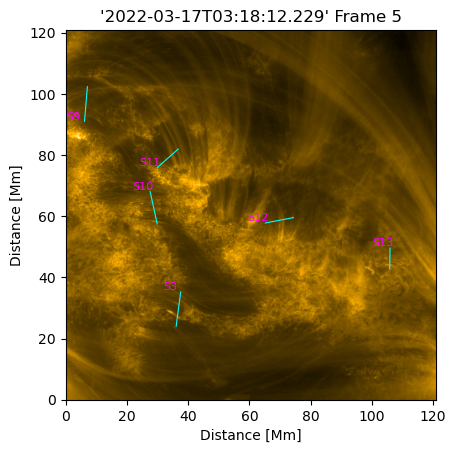

In [10]:
#npy to video with slits

import matplotlib.pyplot as plt
import matplotlib
import glob
import sunpy.visualization.colormaps as cm
import numpy as np
import os
import pandas as pd

global folder_out
global j
global top
global bottom
global left
global right
global mini
global maxi
global dpi
global ax1_unit
global ax2_unit
global gam
global path_save
global img_save
global n
global cmap
global data_slits
global scale

cmap= matplotlib.colormaps['sdoaia171']

folder_in=input("Enter folder containing data: ")
vid_name=input("Enter video name: ")
dpi=300
gam=eval(input("Enter gamma value: "))
path_save=input("Enter path to save video: ")
# left_arcsec=eval(input("Enter the left coordinate in arcsec: "))
# bottom_arcsec=eval(input("Enter the bottom coordinate in arcsec: "))

os.system("mkdir {}/img".format(folder_in))
vid_name=folder_in+"/"+vid_name
img_save=folder_in+"/"+"img/"
folder_in=folder_in+"/"+"*.npy"


pth_first_file=sorted(glob.glob(folder_in))[0]

#data1=fits.open(pth_first_file)
df1=np.load(pth_first_file,allow_pickle='TRUE').item()
data1=df1['data']
header1=df1['hdr']
n=0

maxi=abs(0.8*header1['DATAMAX'])**gam
mini=abs(header1['DATAMIN'])**gam

n1=header1['NAXIS1'][0]
n2=header1['NAXIS2'][0]
cdelt1=header1['CDELT1'][0]
cdelt2=header1['CDELT2'][0]
crpix1=header1['CRPIX1'][0]
crpix2=header1['CRPIX2'][0]
crval1=header1['CRVAL1'][0]
crval2=header1['CRVAL2'][0]

scale=0.135
left=0
right=np.shape(data1)[0]*scale
top=np.shape(data1)[1]*scale
bottom=0


# left=crval1-cdelt1*crpix1+left_arcsec+left_ref
# right=crval1+cdelt1*(n2-crpix1)+left_arcsec+left_ref

# bottom=crval2-cdelt2*crpix2+bottom_arcsec+bottom_ref
# top=crval2+cdelt2*(n2-crpix2)+bottom_arcsec+bottom_ref
#file=fits.open(pth_first_file)
# df1=readsav(, python_dict=True, verbose=True)
# var =  SimpleNamespace(**df1)
# data=var.data
# header=var.hdr
#dat=file[n].data
slit_location_file="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/R2/Slits/slits_location_pixel.csv"

df=pd.read_csv(slit_location_file,sep=',',header=0,names=["slit name","xi","yi","xf","yf","width"])
data_slits=df.to_numpy()

def bytescale(image):
    image=image-mini
    image=image/(maxi-mini)
    image=image*255
    image=np.rint(image)
    return(image)

def fits_to_img(path_load):
    df=np.load(path_load,allow_pickle='TRUE').item()
    dat=df['data']
    header=df['hdr']
    gamma_transformed_data=dat**gam
    dat=bytescale(gamma_transformed_data)

    plt.figure()
    plt.title(str(header['DATE_D$OBS'][0])[1::]+ " Frame {}".format(j))
    plt.xlabel("Distance [Mm]")
    plt.ylabel("Distance [Mm]")
    for i in range(np.shape(data_slits)[0]):
        plt.plot([data_slits[i,1]*scale,data_slits[i,3]*scale],[data_slits[i,2]*scale,data_slits[i,4]*scale],label=data_slits[i,0],c='cyan',linewidth=0.8)
        plt.text((data_slits[i,1]-43)*scale,(data_slits[i,2]+5)*scale,data_slits[i,0],c='magenta',fontsize=8)
        #plt.text((data_slits[i,1]+3)*scale,(data_slits[i,2]+13)*scale,data_slits[i,0],c='magenta',fontsize=8)
    plt.imshow(dat,origin='lower',extent=[left,right,bottom,top],cmap=cmap)
    plt.savefig(img_save+"{:03d}".format(j)+".png",dpi=dpi)
    plt.close()

j=0

for path_load in sorted(glob.glob(folder_in)):
    j+=1
    print("{}/{}".format(j,len(glob.glob(folder_in))))
    fits_to_img(path_load)

cmd='ffmpeg -framerate 60 -start_number 0 -i {}%3d.png -vcodec mpeg4 -vb 20M '.format(img_save)+'{}.mp4'.format(vid_name)
os.system(cmd)
os.system("rm -r {}".format(img_save))

2286.1484827729046


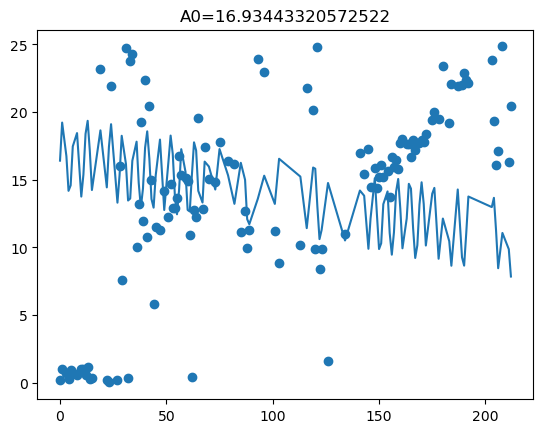

In [164]:
# to get the mean of oscillations
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import sunpy.visualization.colormaps as cm
import pandas as pd

global Am
global P
global phi
global k
global scale
global cadence

scale=135
cadence=3

def sinusoid(t,Ao):
    return(Am*np.sin(2*np.pi*t/P+phi)+k*t+Ao)

slit_name="S2"
loop_name="L19"
path_string=f"/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/oscillations/{slit_name}/{loop_name}/"

osci_file=f"{path_string}oscillation_parameter.csv"
df_osci=pd.read_csv(osci_file,sep=',',header=0,names=["Amplitude [km]","Period [s]","Drift Velocity [km/s]","Phase","Chi-squared [pixel]"])
#df_osci=pd.read_csv(osci_file,sep=',',header=0,names=["Amplitude [km]","Period [s]","Drift Velocity [km/s]","Phase","Off-set","Chi-squared [pixel]"])
data_osci=df_osci.to_numpy()

loop_center_file=f"{path_string}loop_center.csv"
df_loop=pd.read_csv(loop_center_file,sep=",",header=0,names=["Frame","Peak center"])
data_loop=df_loop.to_numpy()

x=data_loop.T[0]
y=data_loop.T[1]

# Am=-data_osci[0,0]
# P=data_osci[0,1]
# k=data_osci[0,2]
# phi=data_osci[0,3]

Am=data_osci[0,0]/scale
P=data_osci[0,1]/cadence
k=data_osci[0,2]/scale*cadence
phi=data_osci[0,3]

sine_param=curve_fit(sinusoid,x,y,p0=[5])[0]

print(sine_param[0]*scale)
plt.scatter(x,y)
plt.title("A0="+f"{sine_param[0]}")
plt.plot(x,sinusoid(x,sine_param[0]))
plt.show()

In [163]:
dictionary={"Amplitude [km]":[Am*scale],"Period [s]":[P*cadence], "Drift Velocity [km/s]":[k*scale/cadence],"Phase":[phi],"Off-set":[sine_param[0]*scale],"Chi-squared [pixel]":[data_osci[0,4]]}
df_param=pd.DataFrame(dictionary)
df_param.to_csv(f"{path_string}oscillation_parameter.csv",index=False)

In [1]:
# collect all the oscillation data into one file.
import pandas as pd
import numpy as np
import glob

oscillation_path="/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/oscillations_revision_2"+"/"

#slits=['S1','S2','S3','S4','S5','S6','S8','S9','S10','S11','S12','S13']
slits=['S1','S2','S3','S5','S6','S8','S9','S10','S11','S12','S13']

dictionary={"Slit name":[],"Loop name":[],"Amplitude [km]":[],"Period [s]":[],"Drift Velocity [km/s]":[],"Phase":[],"Off-set":[],"Chi-squared":[],"Loop Length [Mm]":[],"Loop path":[],"Slit path":[]}

for slit in slits:
    loop_folder=glob.glob(oscillation_path+slit+"/L*")
    for loop in loop_folder:
        loop_name=loop.split("/")[-1]
        df_loop_length=pd.read_csv(loop+"/"+"loop_length.csv",sep=',',header=0,names=["x1","y1",'x2','y2',"Loop Length [Mm]"])
        df_oscillation_param=pd.read_csv(loop+"/"+"oscillation_parameter.csv",sep=',',header=0,names=["Amplitude [km]","Period [s]","Drift Velocity [km/s]","Phase","Off-set","Chi-squared [pixel]"])
        # print(df_loop_length)
        # print(df_oscillation_param)
        dictionary["Slit name"].append(slit)
        dictionary["Loop name"].append(loop_name)
        dictionary["Amplitude [km]"].append(df_oscillation_param["Amplitude [km]"][0])
        dictionary["Period [s]"].append(df_oscillation_param["Period [s]"][0])
        dictionary["Drift Velocity [km/s]"].append(df_oscillation_param["Drift Velocity [km/s]"][0])
        dictionary["Phase"].append(df_oscillation_param["Phase"][0])
        dictionary["Off-set"].append(df_oscillation_param["Off-set"][0])
        dictionary["Chi-squared"].append(df_oscillation_param["Chi-squared [pixel]"][0])
        dictionary["Loop Length [Mm]"].append(df_loop_length["Loop Length [Mm]"][0])
        dictionary["Loop path"].append(loop)
        dictionary["Slit path"].append(oscillation_path+slit)

In [2]:
df_oscillation=pd.DataFrame(dictionary)

In [4]:
df_oscillation.to_csv("/home/vampy/acads/projects/Probing_high_freq_waves_in_corona/Data/solo_L2_EUI-HRIEUV174-IMAGE_2022-03-17T03:18:00_2022-03-17T04:02:00/oscillations_revision_2/combined.csv",index=False)

In [5]:
def velo(amplitude,period):
    return(2*np.pi*amplitude/period)

In [6]:
import matplotlib.pyplot as plt

In [7]:
amplitude=abs(np.array(dictionary["Amplitude [km]"]))
loop_length=abs(np.array(dictionary["Loop Length [Mm]"]))
period=abs(np.array(dictionary["Period [s]"]))
velocity=abs(velo(amplitude,period))

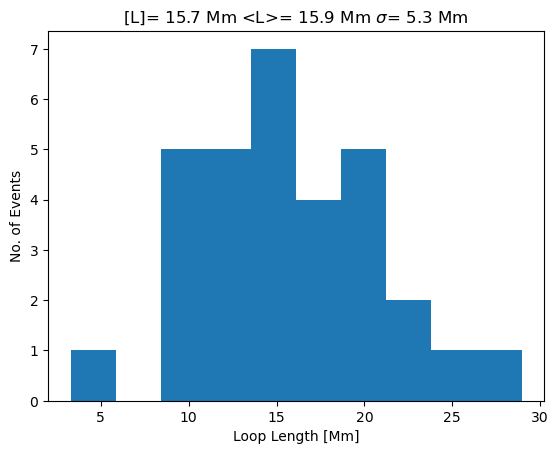

In [8]:
# loop length histogram
# q75, q25 = np.percentile(amplitude, [75 ,25])
# iqr = q75 - q25
# amplitude histogram
average=np.average(loop_length)
median=np.median(loop_length)
sigma=np.std(loop_length)
plt.hist(loop_length)
plt.title(fr"[L]= %.1f Mm <L>= %.1f Mm $\sigma$= %.1f Mm"%(median,average,sigma))
plt.xlabel("Loop Length [Mm]")
plt.ylabel("No. of Events")
plt.show()

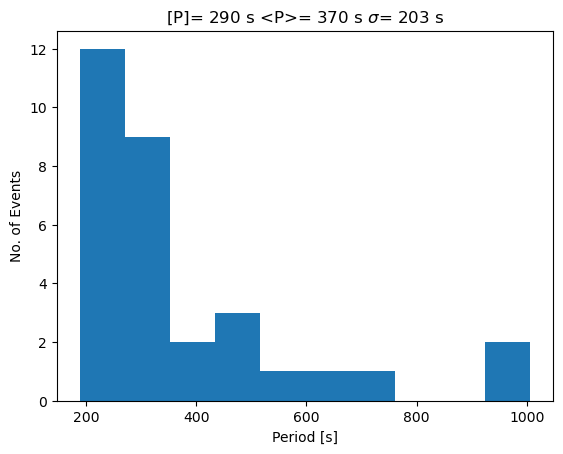

In [9]:
# period histogram
average=np.average(period)
median=np.median(period)
sigma=np.std(period)
plt.hist(period)
plt.title(fr"[P]= %.0f s <P>= %.0f s $\sigma$= %.0f s"%(median,average,sigma))
plt.xlabel("Period [s]")
plt.ylabel("No. of Events")
plt.show()

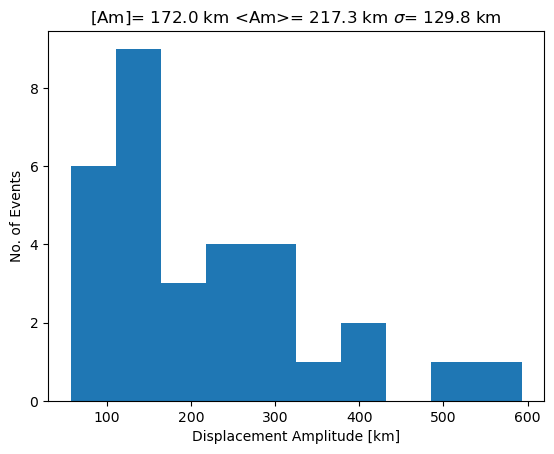

In [10]:
# amplitude histogram
average=np.average(amplitude)
median=np.median(amplitude)
sigma=np.std(amplitude)
plt.hist(amplitude)
plt.title(fr"[Am]= %.1f km <Am>= %.1f km $\sigma$= %.1f km"%(median,average,sigma))
plt.xlabel("Displacement Amplitude [km]")
plt.ylabel("No. of Events")
plt.show()

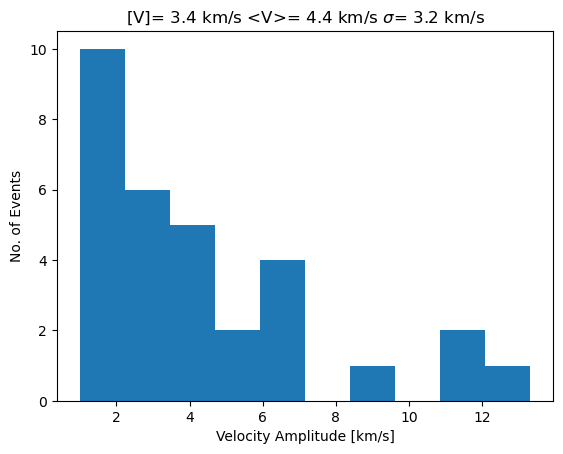

In [11]:
# velocity amplitude histogram
average=np.average(velocity)
median=np.median(velocity)
sigma=np.std(velocity)
plt.hist(velocity)
plt.title(fr"[V]= %.1f km/s <V>= %.1f km/s $\sigma$= %.1f km/s"%(median,average,sigma))
plt.xlabel("Velocity Amplitude [km/s]")
plt.ylabel("No. of Events")
plt.show()

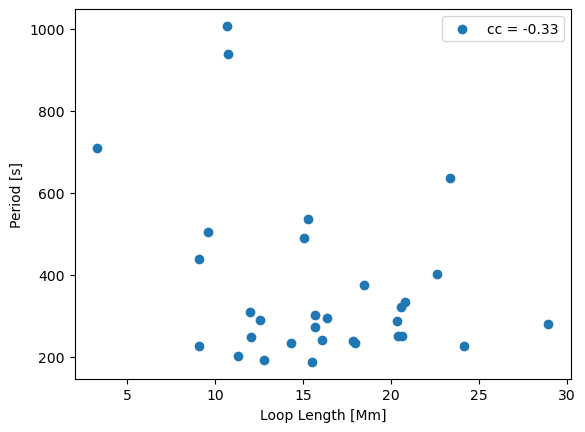

In [12]:
# Loop length vs period
cc=np.corrcoef(period,loop_length)[0,1]
plt.scatter(loop_length,period)
plt.xlabel("Loop Length [Mm]")
plt.ylabel("Period [s]")
plt.legend([f"cc = %.2f"%(cc)])
plt.show()

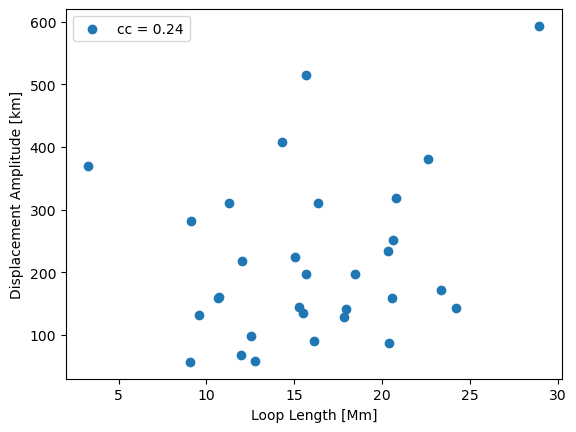

In [13]:
# Loop length vs Amplitude
cc=np.corrcoef(amplitude,loop_length)[0,1]
plt.scatter(loop_length,amplitude)
plt.xlabel("Loop Length [Mm]")
plt.ylabel("Displacement Amplitude [km]")
plt.legend([f"cc = %.2f"%(cc)])
plt.show()

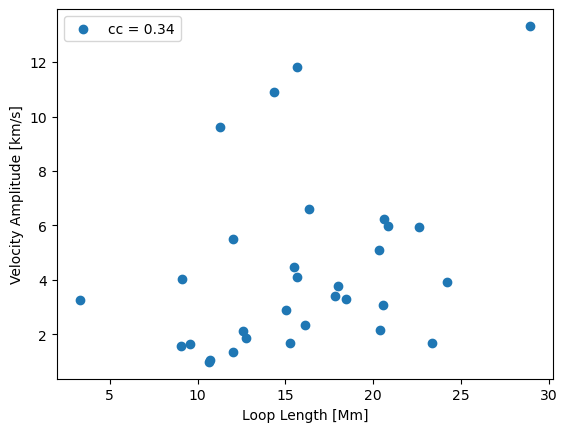

In [14]:
# Loop length vs velocity
cc=np.corrcoef(velocity,loop_length)[0,1]
plt.scatter(loop_length,velocity)
plt.xlabel("Loop Length [Mm]")
plt.ylabel("Velocity Amplitude [km/s]")
plt.legend([f"cc = %.2f"%(cc)])
plt.show()

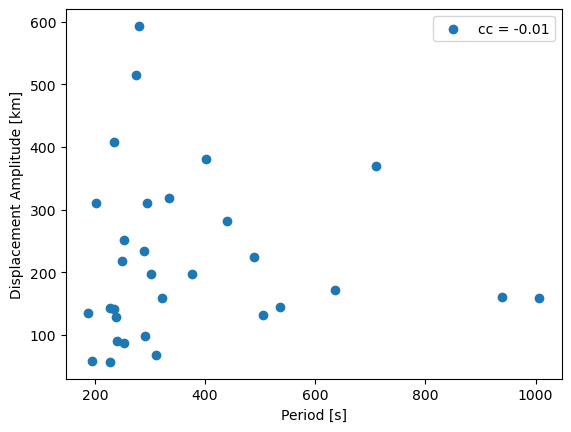

In [15]:
# Period vs Displacement Amplitude
cc=np.corrcoef(period,amplitude)[0,1]
plt.scatter(period,amplitude)
plt.xlabel("Period [s]")
plt.ylabel("Displacement Amplitude [km]")
plt.legend([f"cc = %.2f"%(cc)])
plt.show()

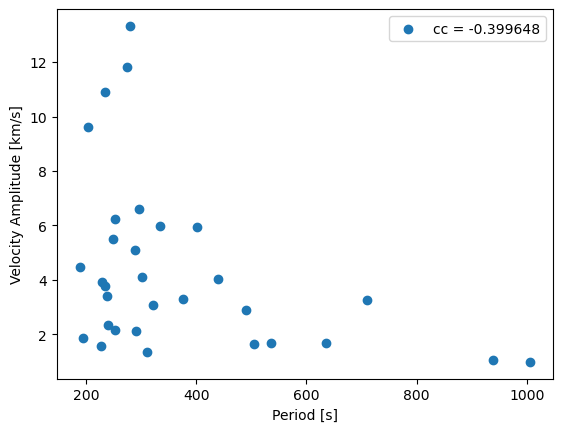

In [16]:
# Period vs Velocity Amplitude
cc=np.corrcoef(period,velocity)[0,1]
plt.scatter(period,velocity)
plt.xlabel("Period [s]")
plt.ylabel("Velocity Amplitude [km/s]")
plt.legend([f"cc = %f"%(cc)])
plt.show()

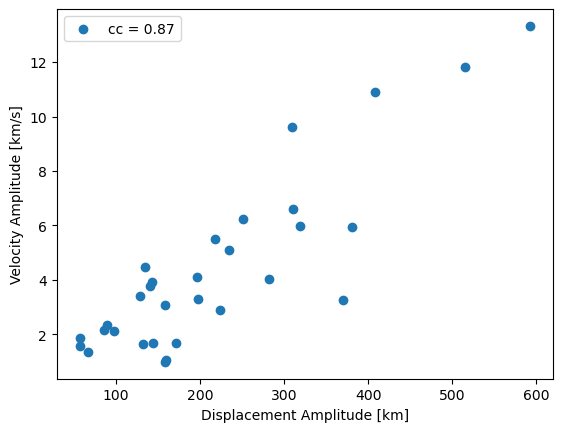

In [18]:
# Displacement Amplitude vs Velocity Amplitude
cc=np.corrcoef(amplitude,velocity)[0,1]
plt.scatter(amplitude,velocity)
plt.xlabel("Displacement Amplitude [km]")
plt.ylabel("Velocity Amplitude [km/s]")
plt.legend([f"cc = %.2f"%(cc)])
plt.show()

In [19]:
def c_k(length,period):
    return(2*length/period)

In [20]:
ck=c_k(loop_length*1000,period)

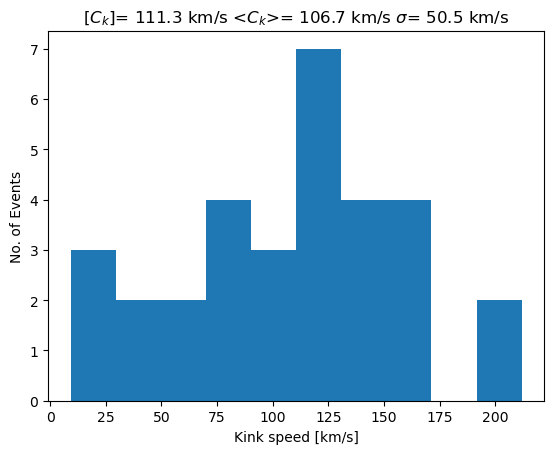

In [21]:
# kink speed histogram
average=np.average(ck)
median=np.median(ck)
sigma=np.std(ck)
plt.hist(ck)
plt.title(fr"[$C_k$]= %.1f km/s <$C_k$>= %.1f km/s $\sigma$= %.1f km/s"%(median,average,sigma))
plt.xlabel("Kink speed [km/s]")
plt.ylabel("No. of Events")
plt.show()

In [22]:
mu=4*np.pi*10**(-7)
#mu=1
mm=1.2
rho_i=10**(9)
def B(ck):
    b=ck*np.sqrt(mu*rho_i*mm)*np.sqrt((1+1/3)/2)
    return(b)

In [23]:
mag_field=B(ck)

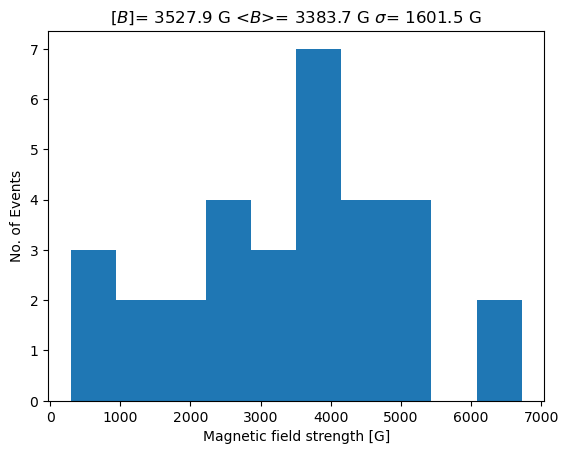

In [24]:
# magnetic filed histogram
average=np.average(mag_field)
median=np.median(mag_field)
sigma=np.std(mag_field)
plt.hist(mag_field)
plt.title(fr"[$B$]= %.1f G <$B$>= %.1f G $\sigma$= %.1f G"%(median,average,sigma))
plt.xlabel("Magnetic field strength [G]")
plt.ylabel("No. of Events")
plt.show()